<a href="https://colab.research.google.com/github/yonitsur/ML-workshop/blob/main/notebooks/pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import cv2
import yaml
import sys
import os
# from google.colab import drive
# import pdb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import cv2
import yaml
import sys
import os
from IPython import display
import time
from google.colab import drive
import torch
import torch.nn as nn
# from tqdm import tqdm
# from PIL import Image
import seaborn as sns
import csv
import json

NORMALIZE = True

import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
from segment_anything.utils.amg import *
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from segment_anything.utils.amg import *
# from pycocotools import mask as mask_utils

print(torch.cuda.is_available())

# sys.path.append("..")
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
mask_generator = SamAutomaticMaskGenerator(sam)

PyTorch version: 2.1.0+cu118
Torchvision version: 0.16.0+cu118
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-doxutz5l
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-doxutz5l
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36588 sha256=e7ca895932a1f57e57d7f6bd3d66d9dcc95e82c985d9b94c05b5e8f036387c8c
  Stored in directory: /tmp/pip-ephem-wheel-cache-y_goy250/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2023-11-20 16:27:21--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.226.210.111, 13.226.210.78,

In [ ]:
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

uploaded = files.upload()
files_name = []
for fn in uploaded.keys():
    files_name.append(fn)
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))

Saving IMG_4306.JPG to IMG_4306.JPG
User uploaded file "IMG_4306.JPG" with length 3034189 bytes


In [ ]:
MIN_MASK_SIZE=1000

In [ ]:
!gdown https://drive.google.com/uc?id=1-CCKi9pZs0Yj860qipdsrN_cpHmHmghk

Downloading...
From: https://drive.google.com/uc?id=1-CCKi9pZs0Yj860qipdsrN_cpHmHmghk
To: /content/transfered_basic_resnet50_big80-10-10
100% 96.5M/96.5M [00:03<00:00, 29.8MB/s]


In [ ]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=25,
    pred_iou_thresh=0.92,
    stability_score_thresh=0.75,
    crop_n_layers=0,
    crop_n_points_downscale_factor=1,
    box_nms_thresh=0.35,
    min_mask_region_area=1000,  # Requires open-cv to run post-processing
    output_mode="uncompressed_rle",
)

labels_dict = { 'Metal':0,
              'Metal (general)': 0,
              'Metal (iron bender)':0,
              'Metal (pipe)':0,
              'Wood (pallett)':1,
              'Wood (pallet)':1,
              'Wood (scraps/cuttings)':1,
              'Wood': 1,
              'Paper':2,
              'Carton':2,
              'Carton+Paper':2,
              'Nylon':3,
              'Plastic (big bag)':3,
              'Plastic (bucket)':3,
              'Plastic (general)':3,
              'Plastic (pipe)':3,
              'Plastic (sand bag)':3,
              'Plastic':3,
              'Polymers':3,
              'Flexible polymers':3,
              'Rigid polymers':3,
              'Gypsum':4,
              'Concrete':4,
              'Ceramics':4,
              'Construction':4,
              'Mineral':4,
              'Rubber':5,
              'Background':6,

              #others
              'Styrofoam':7,
              'Textil':7,
              'Textil/Fabric/Cloth':7,
              'Glass':7,
              'Other':7,
              'Other(Styrofoam, Textil, Glass)':7
              }



reverse_labels_dict =  {
                0:'Metal',
                1:'Wood',
                2:'Carton+Paper',
                3:'Polymers',
                4:'Mineral',
                5:'Rubber',
                6:'Background',
                7:'Other'
                }


def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.autoscale_view('tight')
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = rle_to_mask(ann['segmentation'])
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))

def split_image(image, num_rows, num_cols):
    height, width = image.shape[:2]
    split_height = height // num_rows
    split_width = width // num_cols
    splits = []
    for r in range(num_rows):
        for c in range(num_cols):
            split = image[r*split_height:(r+1)*split_height, c*split_width:(c+1)*split_width]
            splits.append(split)
    return splits

def crop_object(image, mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    contour_mask = np.zeros_like(mask, dtype=np.uint8)
    cv2.drawContours(contour_mask, [largest_contour], 0, 255, -1)
    cropped_image = cv2.bitwise_and(image, image, mask=contour_mask.T)
    max_x = max([largest_contour[i][0][1] for i in range(largest_contour.shape[0])])
    min_x = min([largest_contour[i][0][1] for i in range(largest_contour.shape[0])])
    max_y = max([largest_contour[i][0][0] for i in range(largest_contour.shape[0])])
    min_y = min([largest_contour[i][0][0] for i in range(largest_contour.shape[0])])
    return cropped_image, [min_x, min_y, max_x, max_y]

def get_box_from_mask(mask):
  mask = rle_to_mask(mask)
  pixel_list = np.argwhere(mask)
  min_x = min(pixel[1] for pixel in pixel_list)
  min_y = min(pixel[0] for pixel in pixel_list)
  max_x = max(pixel[1] for pixel in pixel_list)
  max_y = max(pixel[0] for pixel in pixel_list)
  box = [min_x, min_y, max_x, max_y]
  return box

import skimage.feature as feature

def get_texture_features(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  graycom = feature.graycomatrix(gray, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], levels=256)

  # Find the GLCM properties
  contrast = feature.graycoprops(graycom, 'contrast')
  dissimilarity = feature.graycoprops(graycom, 'dissimilarity')
  homogeneity = feature.graycoprops(graycom, 'homogeneity')
  energy = feature.graycoprops(graycom, 'energy')
  correlation = feature.graycoprops(graycom, 'correlation')
  ASM = feature.graycoprops(graycom, 'ASM')

  feat = np.concatenate([contrast, dissimilarity, homogeneity, energy, correlation, ASM])
  mean = feat.mean(axis=1).reshape(-1, 1)
  std = feat.std(axis=1).reshape(-1, 1)
  feat = (feat - mean)/std

  return feat.flatten().tolist()

folder_path = "/content"

def create_data_one(_image_):
  _dict = {}
  # images = os.listdir(ims_folder)
  image_name = _image_.split('.')[0]
  print(f"****** {image_name} ******")
  img = cv2.imread(os.path.join(f"{folder_path}", _image_))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  im_path = f"{folder_path}/{image_name}"
  if not os.path.exists(im_path):
      os.makedirs(im_path)
  cv2.imwrite(f'{im_path}/{image_name}.jpg', cv2.cvtColor(img, cv2.COLOR_RGB2BGR))
  splits = split_image(img, 4, 4)
  _dict[image_name] = {}
  for sp in range(len(splits)):
    split_path = f"{im_path}/split_{sp}"
    if not os.path.exists(split_path):
        os.makedirs(split_path)
    image = splits[sp]
    cv2.imwrite(f'{split_path}/split_{sp}.jpg', cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    masks = mask_generator.generate(image)
    _dict[image_name][sp]= {}
    for i in range(len(masks)):
      try:
        if masks[i]['area'] > MIN_MASK_SIZE:
          mask = masks[i]['segmentation']
          f_mask = rle_to_mask(mask).T
          cropped_image, box = crop_object(image, f_mask)
          cropped_image = cropped_image[box[1]:box[3],box[0]:box[2]]
          cv2.imwrite(f'{split_path}/mask_{i}.jpg', cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR))
          _dict[image_name][sp][f'mask_{i}'] = masks[i]
          _dict[image_name][sp][f'mask_{i}']['textures'] = get_texture_features(cropped_image)
      except:
        print(f'mask_{i}')
  with open(f'{im_path}/seg.yaml', 'w') as f:
      yaml.dump({image_name:_dict[image_name]},f)
  print(f"****** finish  ******")

from tqdm import tqdm

labels_colors={
    'Metal':(0.1, 0.1, 0.1),
    'Wood':(1, 1, 0),
    'Carton+Paper':(0.5, 0.2, 0),
    'Polymers':(1, 0, 0),
    'Mineral':(1, 0.63, 0),
    'Background':(0, 1, 0),
    'Other':(0.5, 0, 1),
    'Rubber':(1, 0, 1)
}






In [ ]:
create_data_one(f"{files_name[0]}")

****** IMG_4306 ******
****** finish  ******


In [ ]:
with open(f'{folder_path}/{files_name[0].split(".")[0]}/seg.yaml') as f:
  seg = yaml.safe_load(f)

  0%|          | 0/16 [00:00<?, ?it/s]

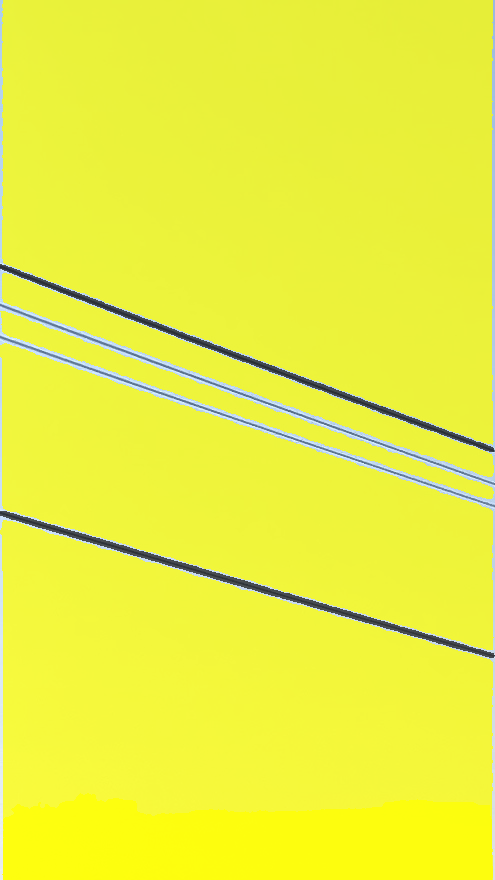

  6%|▋         | 1/16 [00:00<00:05,  2.82it/s]

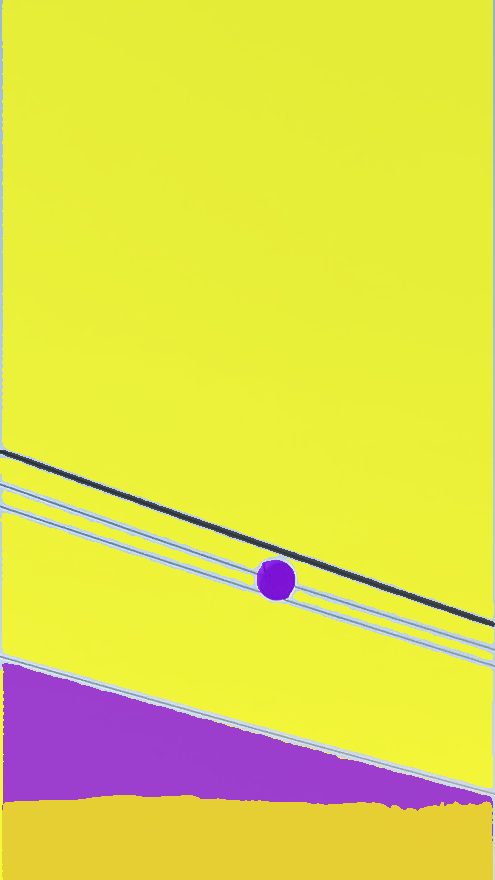

 12%|█▎        | 2/16 [00:00<00:04,  3.31it/s]

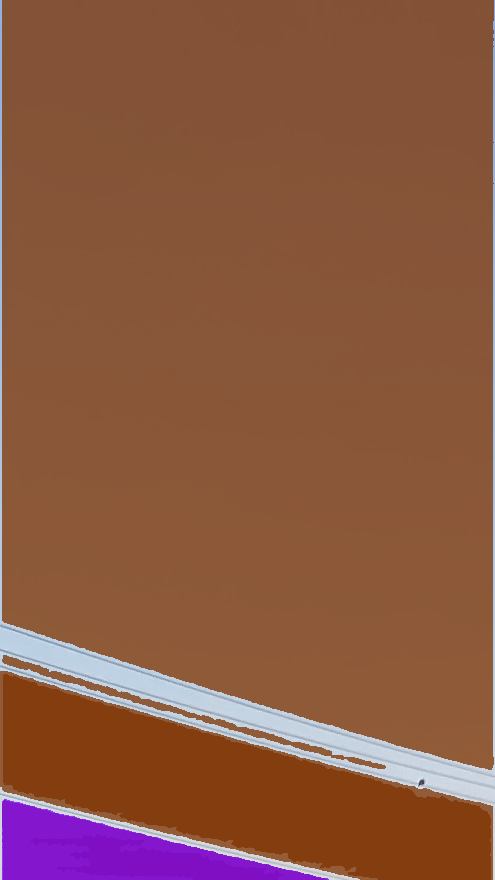

 19%|█▉        | 3/16 [00:00<00:02,  4.48it/s]

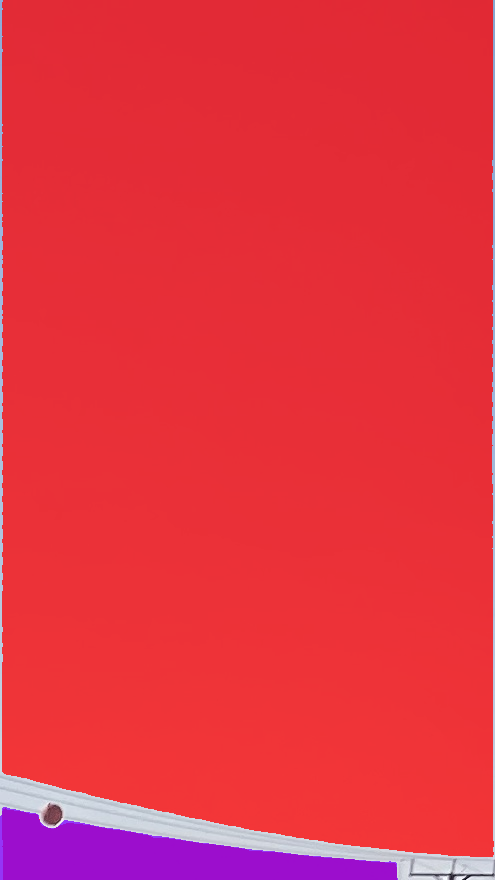

 25%|██▌       | 4/16 [00:00<00:02,  5.58it/s]

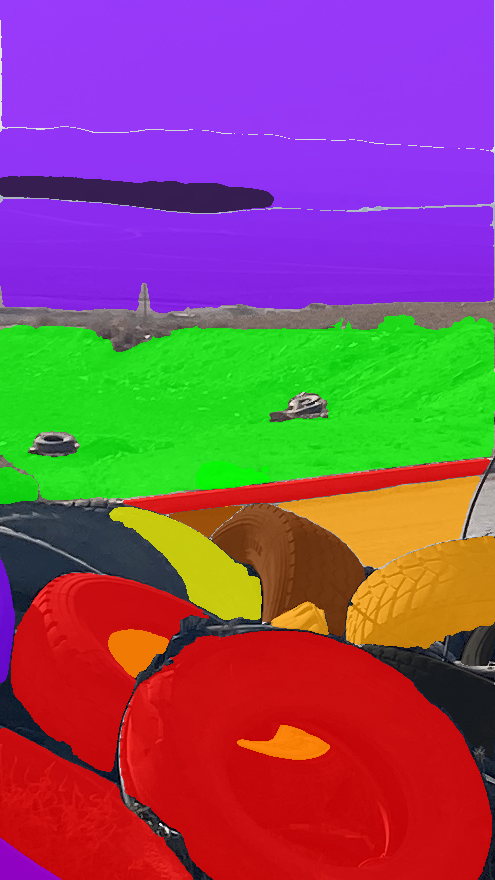

 31%|███▏      | 5/16 [00:01<00:03,  3.05it/s]

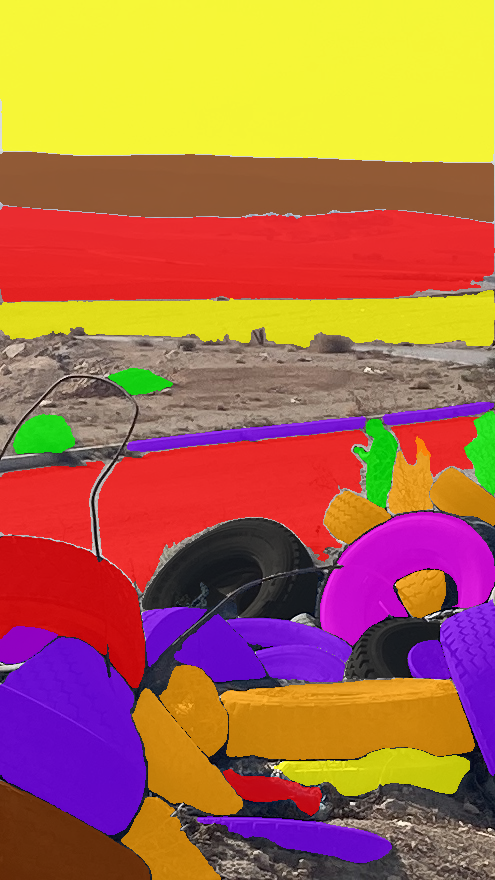

 38%|███▊      | 6/16 [00:02<00:04,  2.34it/s]

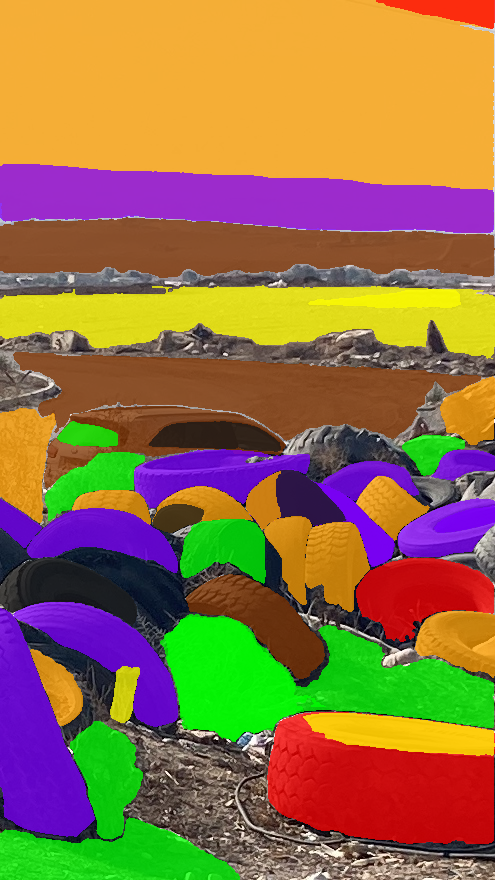

 44%|████▍     | 7/16 [00:02<00:04,  1.82it/s]

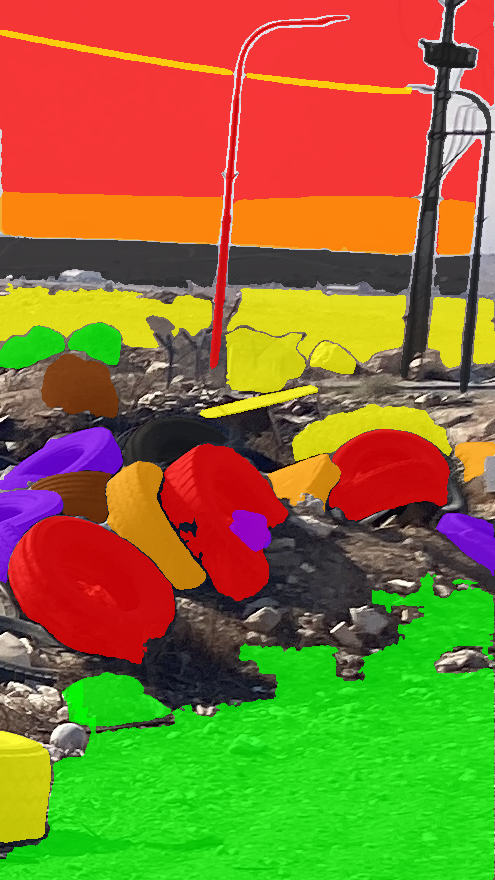

 50%|█████     | 8/16 [00:03<00:05,  1.37it/s]

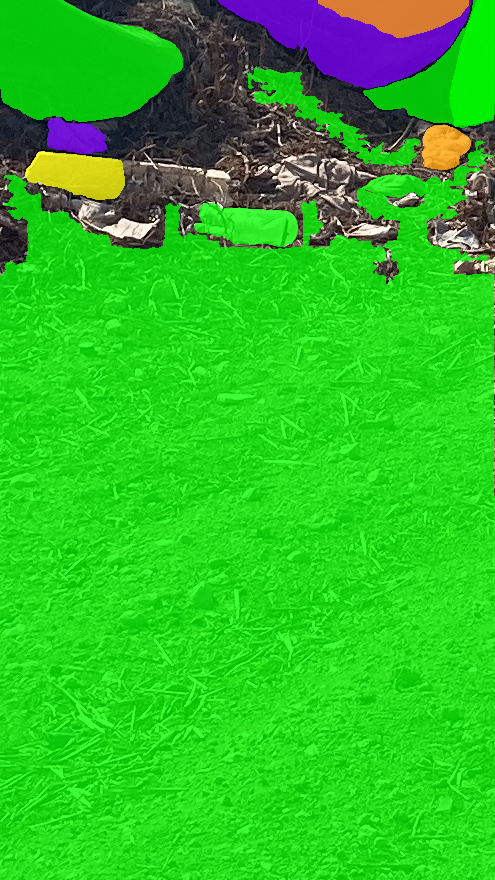

 56%|█████▋    | 9/16 [00:04<00:04,  1.49it/s]

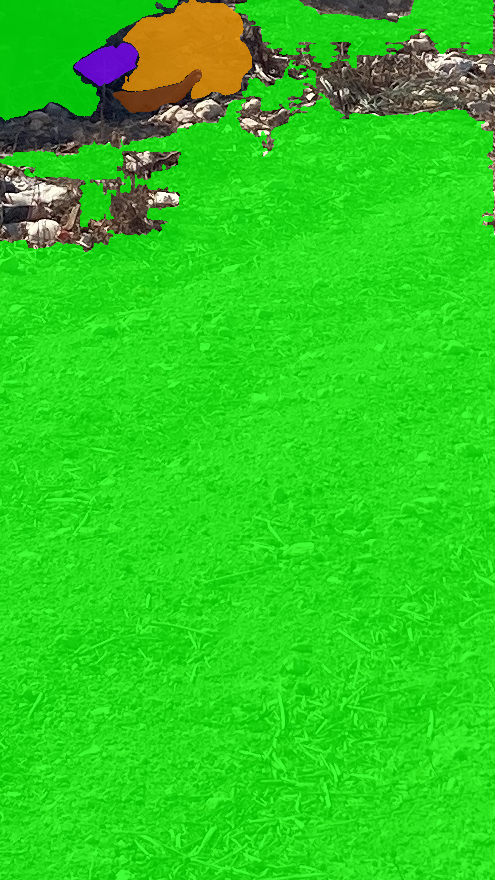

 62%|██████▎   | 10/16 [00:04<00:03,  1.64it/s]

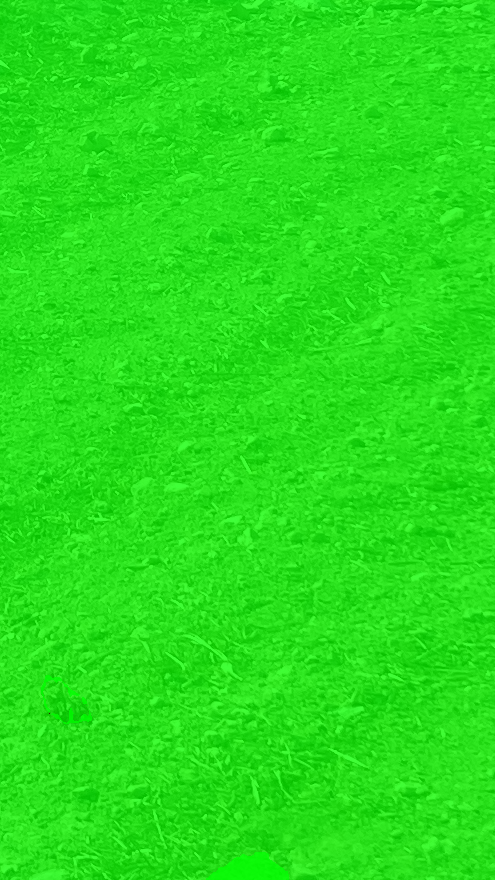

 69%|██████▉   | 11/16 [00:05<00:02,  1.82it/s]

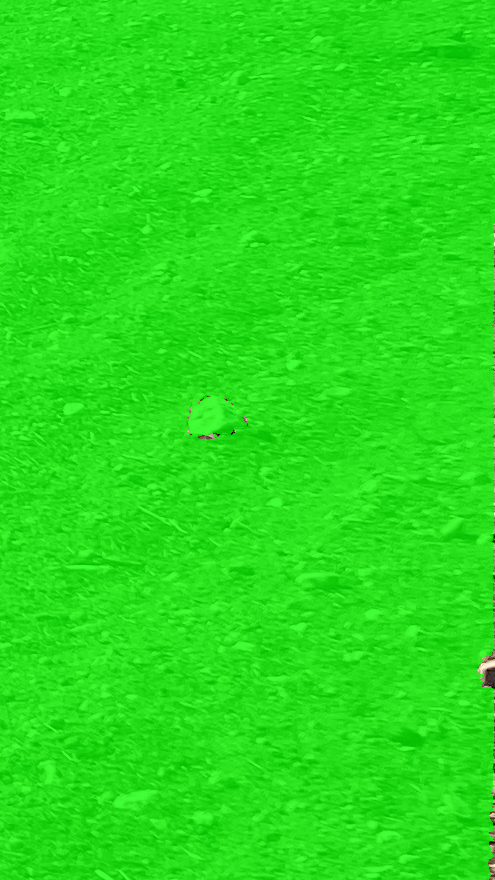

 75%|███████▌  | 12/16 [00:05<00:02,  1.95it/s]

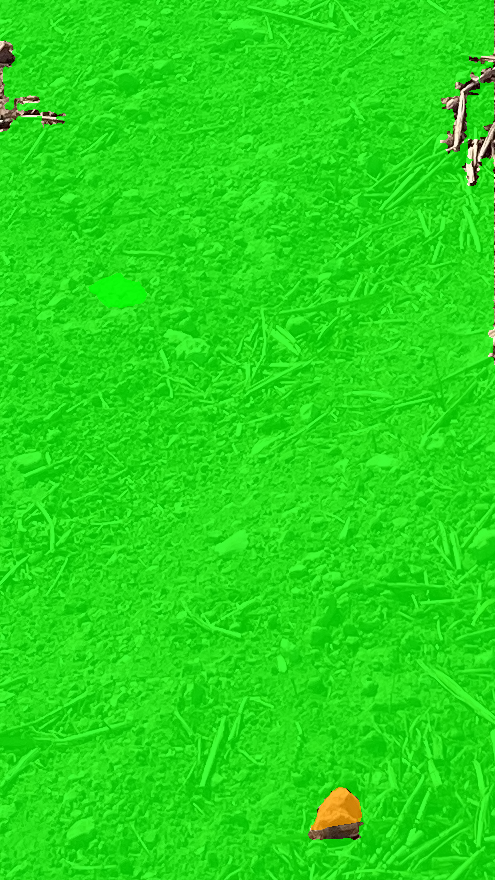

 81%|████████▏ | 13/16 [00:06<00:01,  2.11it/s]

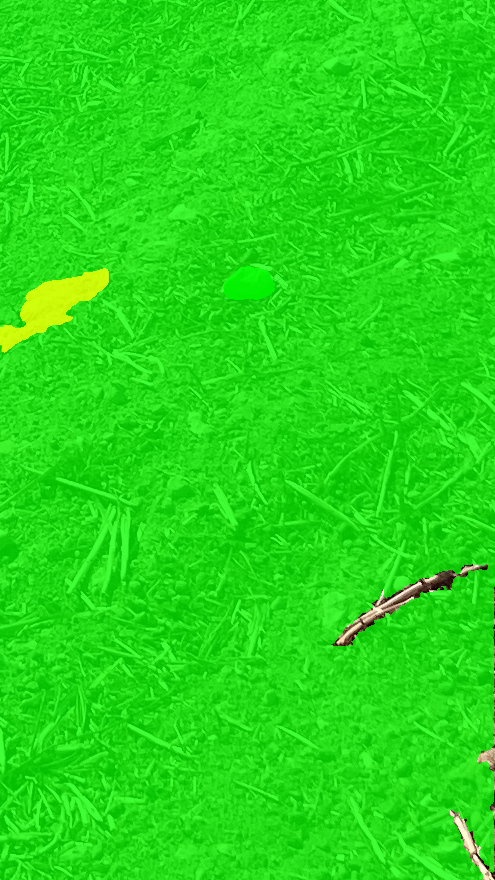

 88%|████████▊ | 14/16 [00:06<00:00,  2.19it/s]

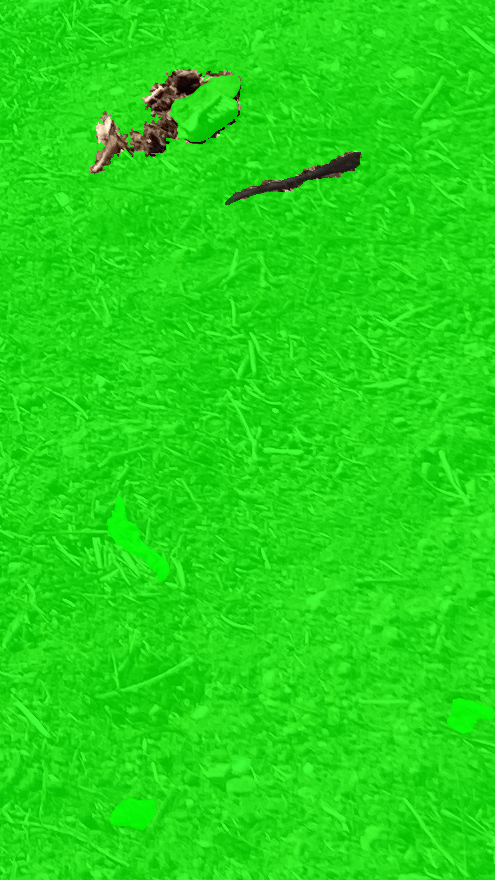

 94%|█████████▍| 15/16 [00:07<00:00,  2.15it/s]

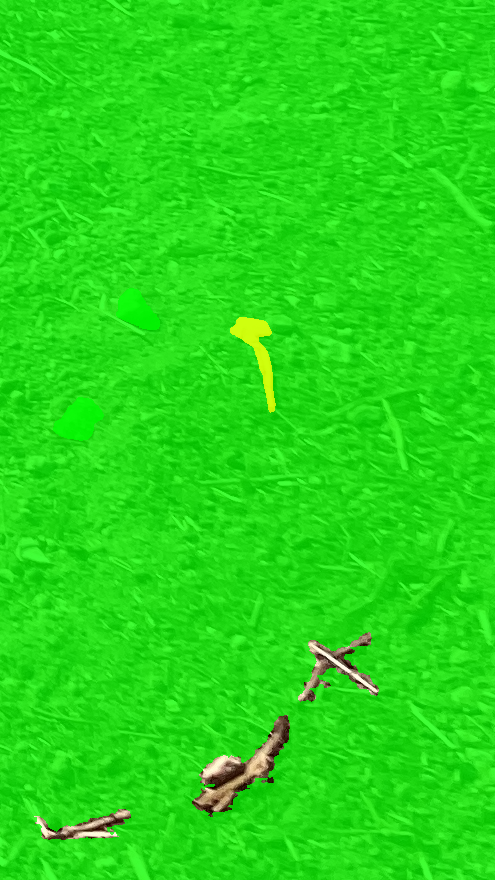

100%|██████████| 16/16 [00:07<00:00,  2.11it/s]


In [ ]:
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import skimage.feature as feature
from torchvision.models import resnet50, ResNet50_Weights

# Best available weights (currently alias for IMAGENET1K_V2)
# Note that these weights may change across versions
original_model = resnet50(weights=ResNet50_Weights.DEFAULT)

weights = ResNet50_Weights.DEFAULT

class Altered(nn.Module):
    def __init__(self):
        super(Altered, self).__init__()
        for param in original_model.parameters():
            param.requires_grad = False
        num_ftrs = original_model.fc.in_features
        original_model.fc = nn.Linear(num_ftrs, 256)
        self.resnet = original_model.cuda()
        self.relu = nn.ReLU(inplace=True)
        self.fc_1 = nn.Linear(256, len(reverse_labels_dict)).cuda()
        # self.fc_2 = nn.Linear(24, len(reverse_labels_dict)).cuda()
        # self.seq = nn.Sequential(self.fc1, nn.ReLU(), self.fc2, nn.ReLU(), self.fc3)

    def forward(self, x):
        im, feat = x
        # feat = feat.cuda()
        out = self.resnet(im)
        out = self.relu(out)
        out1 = self.fc_1(out)

        # feat = feat.float()
        # feat = feat.reshape(-1, 24)
        # out2 = self.fc_2(feat)

        out = out1 #+ out2
        return out

model = Altered()
# print(model)

import torch.optim as optim
from torch.optim import lr_scheduler
# model_conv = torchvision.models.resnet18(weights='DEFAULT')
# for param in original_model.parameters():
#     param.requires_grad = False
#
# # Parameters of newly constructed modules have requires_grad=True by default
# num_ftrs = original_model.fc.in_features
# net = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(256, 14))
# original_model.fc = nn.Linear(num_ftrs, 256)
# model = nn.Sequential(original_model, net).cuda()

# model = original_model
# print(model[0].fc, model[1][1])
criterion = nn.CrossEntropyLoss(torch.Tensor([30,8,5,4,4,900,4,30])) #reweight the loss such that each class has equal contribution to the loss

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD([{'params': model.resnet.fc.parameters()}, {'params': model.fc_1.parameters()}
                            ], lr=0.003, momentum=0.9)

# Decay LR by a factor of 0.1 every 15 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=10, gamma=0.5)

# model_transfered, i = train_model(model, criterion, optimizer_conv,
#                          exp_lr_scheduler, num_epochs=60)
# print(i)
# plt.figure(1)
# plt.subplot(211)
# plt.plot(i[0], label='train_acc')
# plt.plot(i[2], label='val_acc')
# plt.legend()
# plt.plot()
# plt.subplot(212)
# plt.plot(i[1],label='train_loss')
# plt.plot(i[3], label='test_loss')
# plt.legend()
# plt.show()
model_transfered = model
#model_transfered.load_state_dict(torch.load(f'/content/drive/MyDrive/Project/models/transfered_basic_resnet50_big80-10-10_reduced'))
model_transfered.load_state_dict(torch.load(f"/content/transfered_basic_resnet50_big80-10-10"))
model_transfered.eval()

def process_mask(image_name, sp, mask):
  mask_im = cv2.imread(f'{folder_path}/{image_name}/split_{sp}/{mask}.jpg')
  feat = torch.Tensor(seg[image_name][sp][mask]['textures'])
  img = cv2.cvtColor(mask_im, cv2.COLOR_BGR2RGB)
  im_pil = Image.fromarray(img)

  if (seg[image_name][sp][mask]['area']/(im_pil.size[0]*im_pil.size[1]))<0.4:
    best_coverage = 0
    best_img = im_pil
    for _ in [15,30,45,60,75,90]:
      im_pil = im_pil.rotate(_, Image.NEAREST, expand=1)
      image = im_pil
      image_array = np.array(image)
      lower_threshold = np.array([20, 20, 20])  # Minimum color values
      upper_threshold = np.array([255, 255, 255])  # Maximum color values
      binary_mask = np.all((image_array >= lower_threshold) & (image_array <= upper_threshold), axis=-1)
      object_pixels = np.where(binary_mask)

      min_y, min_x = np.min(object_pixels, axis=1)
      max_y, max_x = np.max(object_pixels, axis=1)
      coverage = np.sum(binary_mask)/((max_x-min_x)*(max_y-min_y))

      # print(_, coverage)
      # bbox_image = Image.fromarray(image_array[min_y:max_y+1, min_x:max_x+1])
      # bbox_image.save("bounding_box.png")
      # bbox_image.show()

      # Bounding box coordinates
      im_pil=im_pil.crop((min_x,min_y,max_x,max_y))
      if(coverage>best_coverage):
        best_coverage = coverage
        best_img = im_pil
      im_pil = im_pil.rotate(-_, Image.NEAREST, expand=1)

    im_pil = best_img

  preprocess1 = transforms.Compose([
  transforms.Resize((224,224)),
  # transforms.CenterCrop(224),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])
  # preprocess2 = transforms.Compose([
  # transforms.Resize((224,224)),
  # # transforms.CenterCrop(224),
  # transforms.ToTensor(),
  # transforms.ColorJitter(brightness=0.02, contrast=0.02, saturation=0.02, hue=0.02),
  # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  # ])
  # input_tensor = preprocess(im_pil)
  # if NORMALIZE:
  #     # if self.color_aug:
  #     #   input_tensor = preprocess2(im_pil)
  #     # else:
  input_tensor = preprocess1(im_pil)
  # else:
  #     input_tensor = preprocess0(im_pil)
  return input_tensor, feat

def show_anns(image, anns, predicted,cat):

    if len(anns) == 0:
        return
    anns=list({x:anns[x] for x in predicted}.values())
    predicted = list(predicted.values())
    zipped_lists = zip(anns, predicted)

    sorted_pairs = sorted(zipped_lists, key=(lambda x: x[0]['area']), reverse=True)

    anns_sorted, predicted_sorted = zip(*sorted_pairs)
    #sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    anns = list(anns_sorted)
    predicted = list(predicted_sorted)
    # ax = plt.gca()
    # ax.set_autoscale_on(False)
    polygons = []
    color = []
    #for ann in sorted_anns:
    z= zip(anns, predicted)

    for ann, label in zip(anns_sorted, predicted_sorted):
        m = rle_to_mask(ann['segmentation'])
        color_mask = labels_colors[label]
        mask_overlay = np.ones(image.shape, dtype=np.uint8)

        for i in range(3):
            mask_overlay[:, :, i] = color_mask[i]*255

        # Overlay the colored mask on the image
        where_mask = m.astype(bool)
        image[where_mask] = cv2.addWeighted(image, 0.25, mask_overlay, 0.75, 0)[where_mask]
    # for i, (ann, label) in enumerate(z):
    #     # print(i, label)
    #     m = rle_to_mask(ann['segmentation'])
    #     img = np.ones((m.shape[0], m.shape[1], 3))
    #     color_mask = labels_colors[label]
    #     # color_mask = np.random.random((1, 3)).tolist()[0]
    #     for i in range(3):
    #         img[:,:,i] = color_mask[i]
    #     plt.imshow(np.dstack((img, m*0.75)))
    return image

def show_anns2(anns, predicted,cat):

    if len(anns) == 0:
        return
    anns=list({x:anns[x] for x in predicted}.values())
    #sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    #for ann in sorted_anns:
    z= zip(anns, list(predicted.values()))

    for i, (ann, label) in enumerate(z):
        # print(i, label)
        m = rle_to_mask(ann['segmentation'])
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = labels_colors[label]
        # color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.75)))

def process_image(im_name, spl,cat=None):
  correct_counter = 0
  total_counter = 0
  for sp in tqdm(spl):
     # try:
        predicted = {}
        for m in seg[im_name][sp].items():
          # print(m)
          m_name, _ = m
          inputs, feat = process_mask(im_name, sp, m_name)
          outputs = model_transfered((inputs.unsqueeze(0).cuda(), feat))
          _, preds = torch.max(outputs, 1)
          predicted[m_name] = reverse_labels_dict[preds[0].item()]
          # print("Predicted:",reverse_labels_dict[preds[0].item()],"Actual:", lab)
          # try:
          #   if preds[0].item() == labels_dict[lab]:
          #     correct_counter += 1
          #   total_counter += 1
          # except:
          #   pass

        img = cv2.imread(f'{folder_path}/{im_name}/split_{sp}/split_{sp}.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        masks = seg[im_name][sp]
        # masks = [x for i,x in enumerate(masks) if f"mask_{i}" in predicted.keys()]
        # plt.imshow(img)
        # plt.colorbar(heatmap)
        #show_anns(masks, predicted)
        # Display the image with masks and annotations
        # plt.figure(figsize=(12, 6))  # Adjust the figure size as needed

        # plt.subplot(1, 2, 1)
        # plt.imshow(img)
        # show_anns(masks, predicted)
        # plt.axis('off')

        colors = labels_colors
        categories = list(colors.keys())

        values = np.linspace(0, 1, len(categories))
        # cmap = plt.cm.colors.ListedColormap([colors[category] for category in categories])
        # norm = plt.cm.colors.Normalize(vmin=0, vmax=len(categories)-1)
        # sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        # sm.set_array([])  # Dummy array for the ScalarMappable


        # spec = plt.GridSpec(1, 3, width_ratios=[19,19, 1])  # Adjust ratios as needed
        # fig = plt.figure()  # Adjust the figure size as needed
        # ax1 = fig.add_subplot(spec[0])
        # ax1.imshow(img)
        # ax1.axis('off')
        # Display the image with masks and annotations in the first subplot
        # ax2 = fig.add_subplot()
        # ax2.imshow(img)
        # cv2.imshow(img)
        # plt.subplots_adjust(left=0, right=1, top=1, bottom=0, hspace=0, wspace=0)
        # plt.margins(0, 0)
        # plt.gca().xaxis.set_major_locator(plt.NullLocator())
        # plt.gca().yaxis.set_major_locator(plt.NullLocator())
        # ax2.autoscale_view('tight')
        if predicted!={}:
          img = show_anns(img, masks, predicted, cat)
          # ax2.axis('off')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        # Create a color bar in the second subplot
        # ax3 = fig.add_subplot(spec[2])
        # color_bar = plt.colorbar(sm, cax=ax3)
        # color_bar.set_ticks(np.arange(len(categories)))
        # color_bar.set_ticklabels(categories)
        # color_bar.set_label('Category Label')
        #
        # # Change the font size of the colorbar labels
        # color_bar.ax.tick_params(labelsize=14)  # tick label size
        # color_bar.set_label('Category Label', fontsize=18)  # main label size
        # plt.tight_layout()  # Adjust spacing between subplots
        # plt.show()
        if not os.path.exists(f"{folder_path}/output"):
          os.makedirs(f"{folder_path}/output")
        cv2_imshow(img)
        cv2.imwrite(f"{folder_path}/output/here{sp}.jpg", img)
        # plt.savefig(f"{folder_path}/output/here{sp}")
      # except:
      #   continue

# for i in range(16):
process_image(f"{files_name[0].split('.')[0]}", range(16))



In [ ]:

small_images = [cv2.imread(f"{folder_path}/output/here{i}.jpg") for i in range(16)]
rows, cols, _ = small_images[0].shape
# big_image = np.zeros((rows * 4, cols * 4, 3), dtype=np.uint8)
# for i in range(4):
#     for j in range(4):
#         x_offset = i * rows
#         y_offset = j * cols
#         big_image[x_offset:x_offset + rows, y_offset:y_offset + cols] = smallimages[i * 4 + j]
big_rows = []
for i in range(0, 16, 4):
    # Horizontally concatenate 4 images to make a big row
    big_row = np.hstack([small_images[i], small_images[i+1], small_images[i+2], small_images[i+3]])
    big_rows.append(big_row)

big_image = np.vstack(big_rows)
cv2.imwrite(f"{folder_path}/output/big_image.jpg", big_image)
# cv2_imshow(big_image)
# cv2.waitKey(0)

True